In [1]:
%matplotlib inline
# importing libraries
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import cv2 as cv
import matplotlib.animation as animation

## Fuction to visualize the frames

In [2]:
def plot_results(avg_intensity_frames):
    # ploting the average intensity of the average frames
    if len(avg_intensity_frames) > 100:
        for i in range(0, len(avg_intensity_frames), 100):
            plt.figure(figsize=(30, 10))
            plt.xticks(np.arange(0, len(avg_intensity_frames[i:i+100]), 1))
            plt.plot(avg_intensity_frames[i:i+100])
            plt.show()
    else:
        plt.figure(figsize=(20, 10))
        plt.xticks(np.arange(0, len(avg_intensity_frames), 1))
        plt.plot(avg_intensity_frames)
        plt.show()

## Function to plot the values

In [3]:
def plot_diff_frames(frames,index,index2):
    # plot 2x5 subplots 
    fig, axs = plt.subplots(2, len(frames[index]), figsize=(30, 10))
    # axis off
    for ax in axs.flat:
        ax.axis('off')
    for i in range(len(frames[index])):
        axs[0, i].imshow(frames[index][i])
        axs[1, i].imshow(frames[index2][i])
        axs[0, i].set_title('frame ' + str(i))
        axs[1, i].set_title('frame ' + str(i))
    plt.show()

# Statistical readings

In [4]:
def get_statistics(l):
    # Box plot of the average intensity of the average frames
    plt.figure(figsize=(20, 10))
    plt.boxplot(l)
    # value of the median
    plt.axhline(np.median(l), color='r', linestyle='dashed', linewidth=1)
    # Value of the first quartile
    plt.axhline(np.percentile(l, 25), color='r', linestyle='dashed', linewidth=1)
    # Value of the third quartile
    plt.axhline(np.percentile(l, 75), color='r', linestyle='dashed', linewidth=1)
    plt.title("Box plot")
    plt.show()

    # distribution of the average intensity of the average frames
    plt.figure(figsize=(20, 10))
    plt.title("Values distribution")
    plt.hist(l, bins=50)
    plt.show()

    # data frame with the statistics
    df = pd.DataFrame({"mean": [np.mean(l)], "median": [np.median(l)], "first quartile": [np.percentile(l, 25)], "third quartile": [np.percentile(l, 75)], "upper whisker": [np.percentile(l, 75) + 1.5*(np.percentile(l, 75) - np.percentile(l, 25))], "lower whisker": [np.percentile(l, 25) - 1.5*(np.percentile(l, 75) - np.percentile(l, 25))], "variance": [np.var(l)], "standard deviation": [np.std(l)]})

    # render dataframe on notebook
    return df
    


In [5]:
def get_outlier(l_avg_int):
    # all values above the upper whisker or under the lower whisker are considered outliers
    outliers = []
    upper_whisker = np.percentile(l_avg_int, 75) + 1.5*(np.percentile(l_avg_int, 75) - np.percentile(l_avg_int, 25))
    lower_whisker = np.percentile(l_avg_int, 25) - 1.5*(np.percentile(l_avg_int, 75) - np.percentile(l_avg_int, 25))
    for i in range(len(l_avg_int)):
        if l_avg_int[i] > upper_whisker or l_avg_int[i] < lower_whisker:
            outliers.append(i)
    return outliers


In [6]:
def values_diff (l):
    diff = []
    indexes = []
    for i in range(len(l)-1):
        diff.append(abs(l[i+1] - l[i]))
        indexes.append([i , i+1])

    # ploting the difference between the average intensity of the average frames

    plt.figure(figsize=(20, 10))
    plt.plot(diff)
    plt.show()
    
    return diff, indexes

In [7]:
# get the index of the biggest difference between the frames
def get_index_of_biggest_difference(avg_intensity_frames):
    # getting the index of the biggest difference between the frames
    index_of_biggest_difference = []
    for i in range(len(avg_intensity_frames)-1):
        index_of_biggest_difference.append(abs(avg_intensity_frames[i] - avg_intensity_frames[i+1]))

    index_of_biggest_difference = np.argmax(index_of_biggest_difference)
    return index_of_biggest_difference

# Trying to improve the method

In this version of the fuction, we added the smoothing filter to reduce the noise in the images, and we also added the sharpening filter to make the edges well appeared. it add on the time of the process.

the steps are the same as well as the used parameters.

In [8]:
def applied_method2(cap, frames_to_take):
    # getting the frame rate
    fps = cap.get(cv.CAP_PROP_FPS)
    # getting the frame count
    frame_count = int(cap.get(cv.CAP_PROP_FRAME_COUNT))
    
    frames = []
    gray_frames = []
    for i in range(0, frame_count, frames_to_take):
        ls = []
        ls2 = []
        for j in range(i,i+frames_to_take):
            ret, frame = cap.read()
            if ret == False:
                break
            else:
                # blurring the frame medianBlur
                frame = cv.medianBlur(frame, 7)
                # Sharpening the frame
                kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
                frame = cv.filter2D(frame, -1, kernel)
                gray = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)
                ls2.append(gray)
                ls.append(frame)
        if len(ls) == frames_to_take:
            gray_frames.append(ls2)
            frames.append(ls)

    # avg of each row in gray_frames
    avg_ls = []
    for row in gray_frames:
        avg_image = row[0]
        for i in range(len(row)):
            if i == 0:
                pass
            else:
                alpha = 1.0/(i + 1)
                beta = 1.0 - alpha
                avg_image = cv.addWeighted(avg_image, alpha, row[i], beta, 0.0)
        avg_ls.append(avg_image)



    # calculate the average intensity of the average frames
    avg_intensity_frames = []
    
    for i in range(len(avg_ls)):
        avg_intensity_frames.append(np.mean(avg_ls[i]))


    return avg_intensity_frames, frames

## testing the method on the first video

In [9]:
cap = cv.VideoCapture('rl4_pb17-4.mp4')

frames_to_take = input("Enter the number of frames to take: ")
frames_to_take = int(frames_to_take)

# getting the frame rate
fps = cap.get(cv.CAP_PROP_FPS)

print(f"video fps: {fps}")

# getting the frame count
frame_count = int(cap.get(cv.CAP_PROP_FRAME_COUNT))

print(f"video frame count: {frame_count} ,frames tooked into consideration: {frames_to_take} , values = {frame_count/frames_to_take}")

# applying the method to the video
avg_intensity_frames3, frames3 = applied_method2(cap, frames_to_take)

video fps: 29.703158414733778
video frame count: 938 ,frames tooked into consideration: 5 , values = 187.6


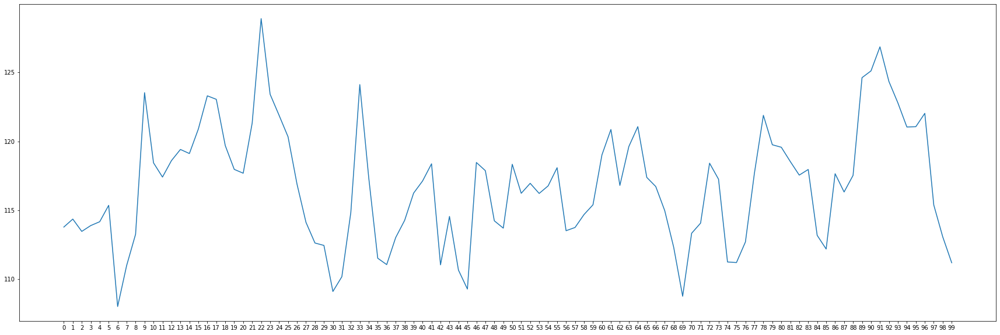

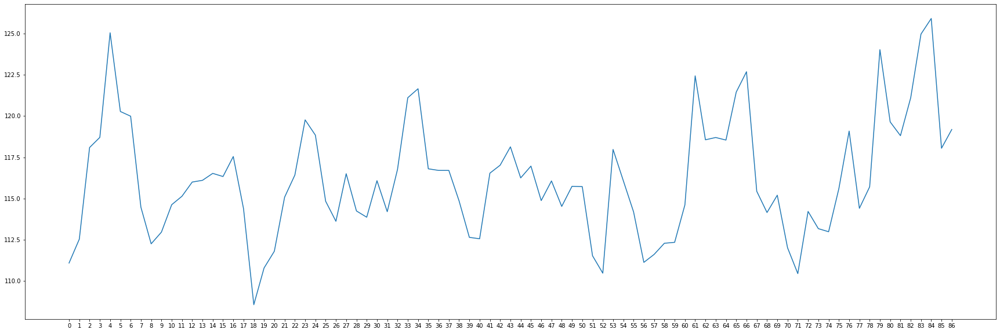

In [10]:
# ploting the average intensity of the average frames
plot_results(avg_intensity_frames3)

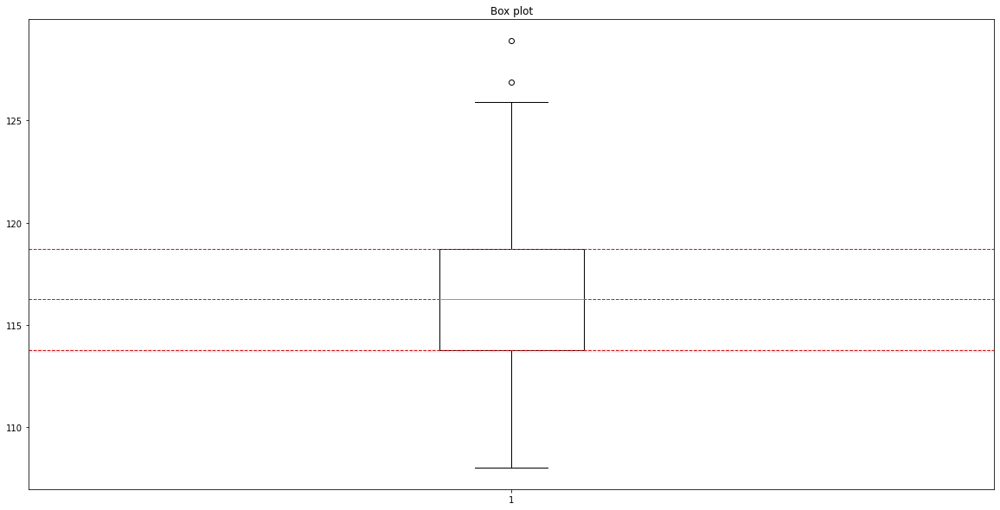

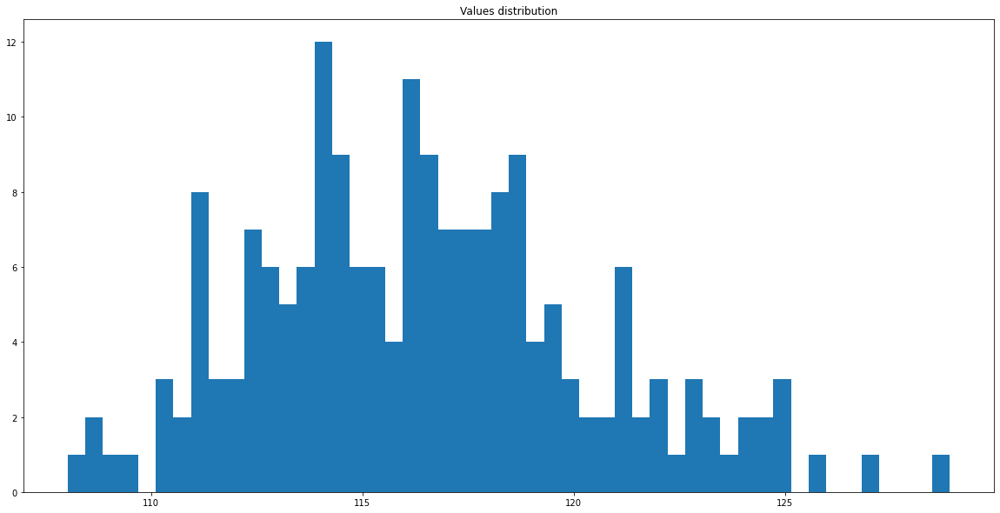

,mean,median,first quartile,third quartile,upper whisker,lower whisker,variance,standard deviation
0,116.502198,116.253579,113.767843,118.705646,126.11235,106.361139,15.604738,3.950283


In [11]:
get_statistics(avg_intensity_frames3)

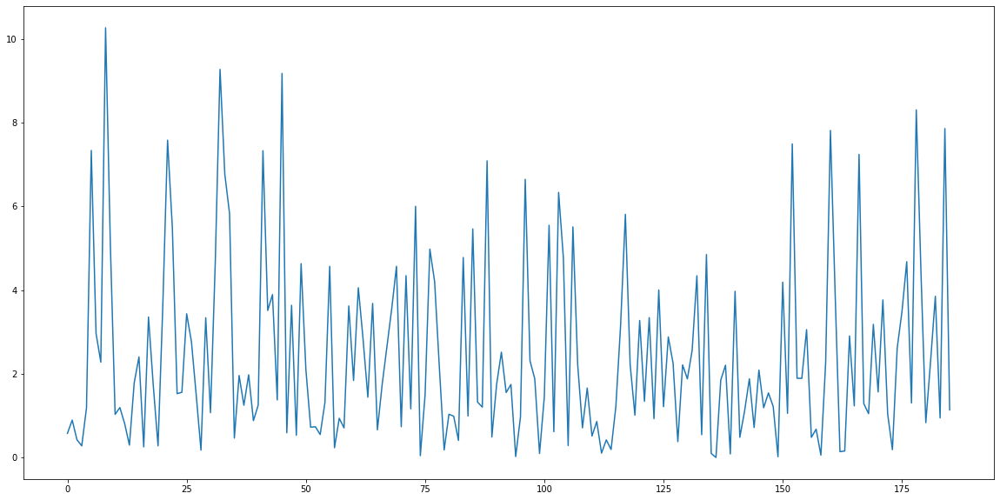

In [12]:
# calculating the diffrence between the frames
diff_vid3,indexes_vid3 = values_diff(avg_intensity_frames3)

In [13]:
# delete values less than 8
diff = []
indexes = []

for i in range(len(diff_vid3)):
    if diff_vid3[i] > 8:
        diff.append(diff_vid3[i])
        indexes.append(indexes_vid3[i])

pd.DataFrame({"diff": diff, "indexes": indexes})

,diff,indexes
0,10.270467,"[8, 9]"
1,9.276489,"[32, 33]"
2,9.180234,"[45, 46]"
3,8.308596,"[178, 179]"


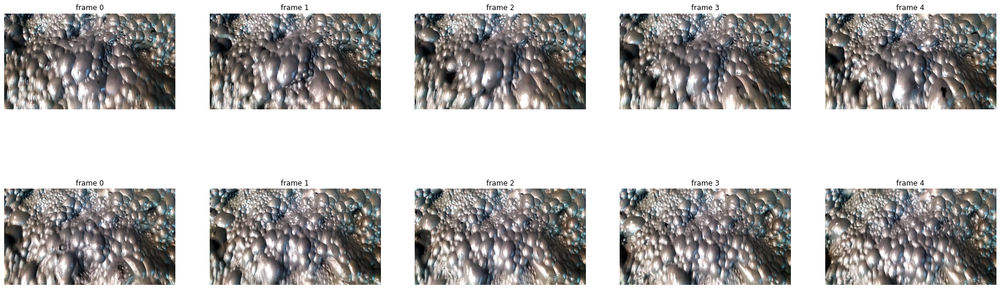

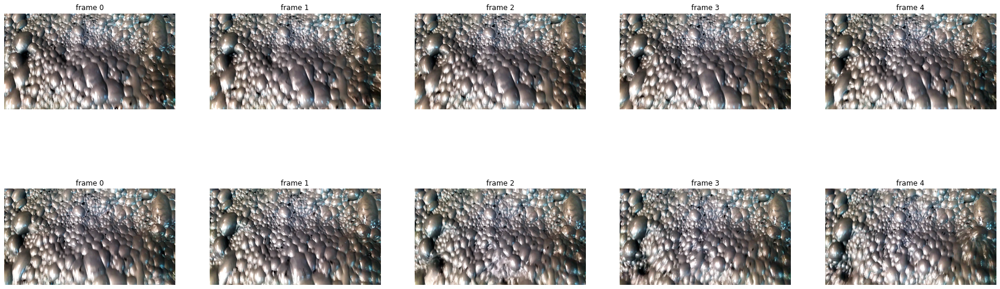

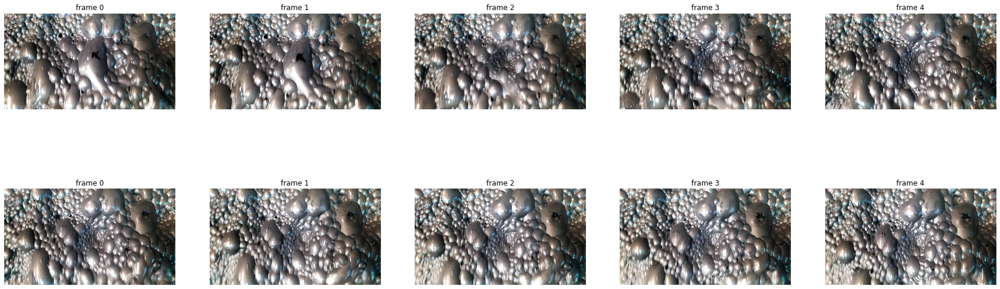

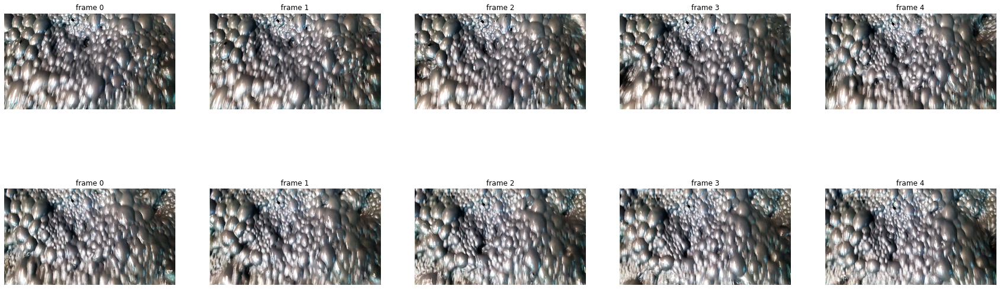

In [14]:
# ploting the frames
for i in indexes:
    plot_diff_frames(frames3, i[0], i[1])

index of the biggest difference: 8 , 9 and the difference is: 113.26212239583333 - 123.53258897569444 = 10.270466579861107


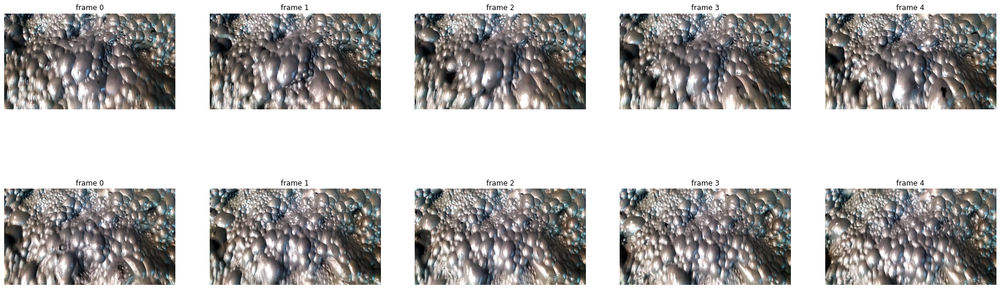

In [17]:


index_of_biggest_difference3 = get_index_of_biggest_difference(avg_intensity_frames3)

print(f"index of the biggest difference: {index_of_biggest_difference3} , {index_of_biggest_difference3 + 1} and the difference is: {avg_intensity_frames3[index_of_biggest_difference3]} - {avg_intensity_frames3[index_of_biggest_difference3+1]} = {abs(avg_intensity_frames3[index_of_biggest_difference3] - avg_intensity_frames3[index_of_biggest_difference3+1])}")

plot_diff_frames(frames3,index_of_biggest_difference3, index_of_biggest_difference3 + 1)


## Testing the method on the second video

In [18]:
cap2 = cv.VideoCapture('rl4_pb8-7.mp4')

frames_to_take = input("Enter the number of frames to take: ")
frames_to_take = int(frames_to_take)

# getting the frame rate
fps = cap2.get(cv.CAP_PROP_FPS)

print(f"video fps: {fps}")

# getting the frame count
frame_count = int(cap2.get(cv.CAP_PROP_FRAME_COUNT))

print(f"video frame count: {frame_count} ,frames tooked into consideration: {frames_to_take} , values = {frame_count/frames_to_take}")

# applying the method to the video
avg_intensity_frames4, frames4 = applied_method2(cap2, frames_to_take)

video fps: 29.95603334971612
video frame count: 898 ,frames tooked into consideration: 5 , values = 179.6


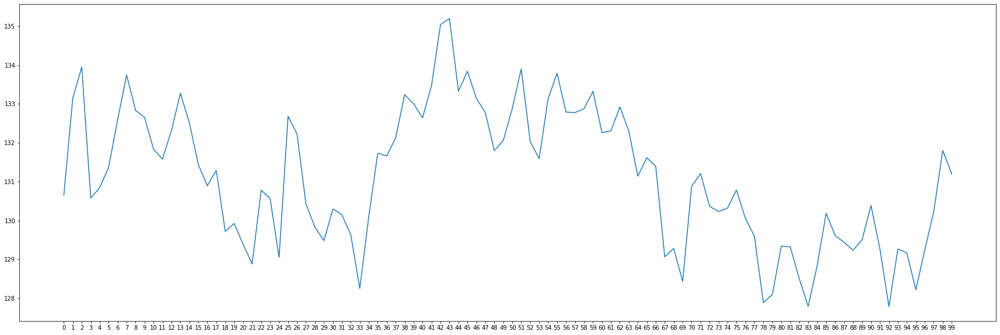

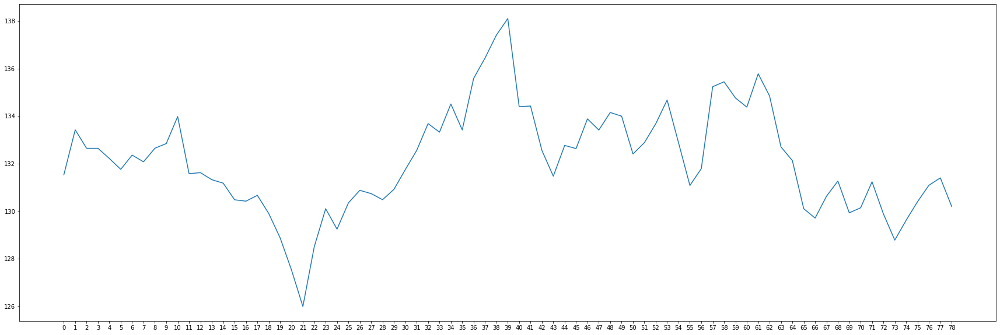

In [19]:
# ploting the average intensity of the average frames
plot_results(avg_intensity_frames4)

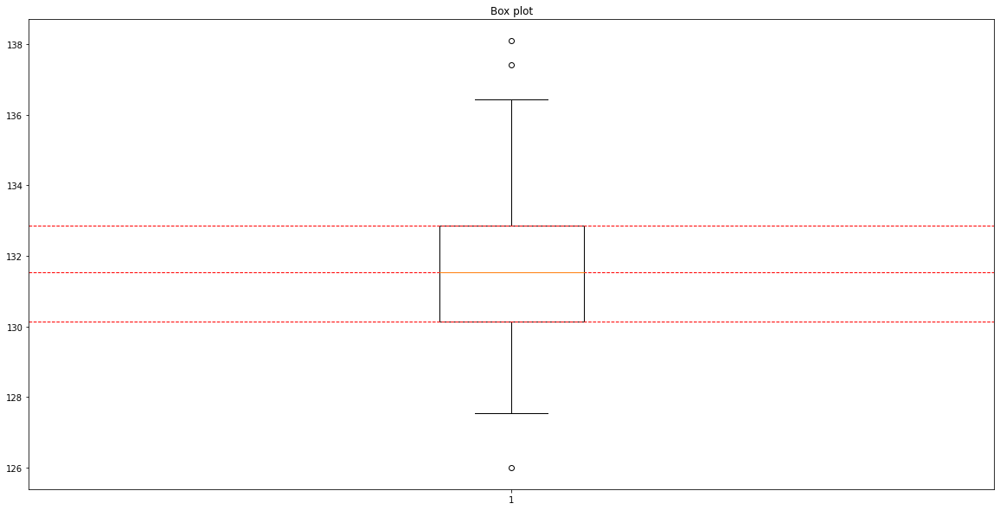

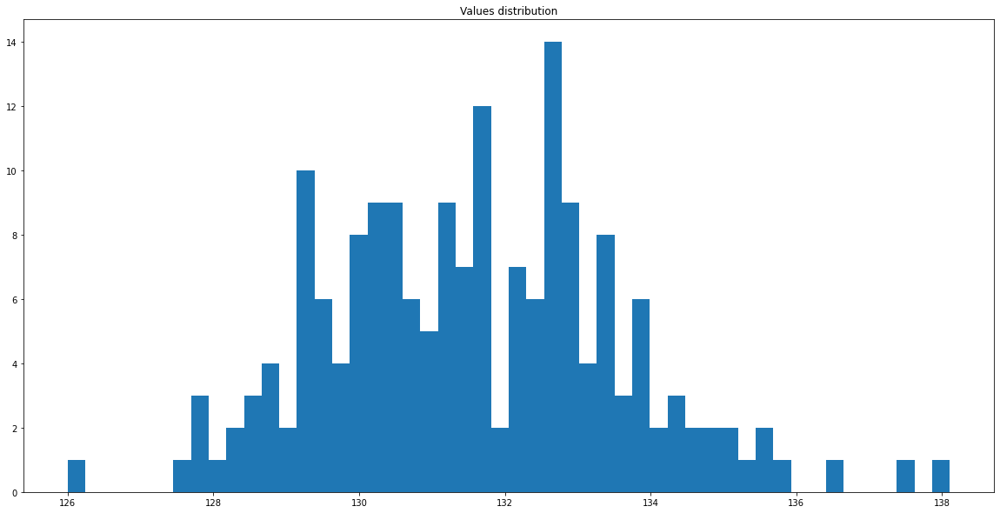

,mean,median,first quartile,third quartile,upper whisker,lower whisker,variance,standard deviation
0,131.568291,131.538823,130.131778,132.864312,136.963112,126.032978,4.054994,2.013701


In [20]:
get_statistics(avg_intensity_frames4)

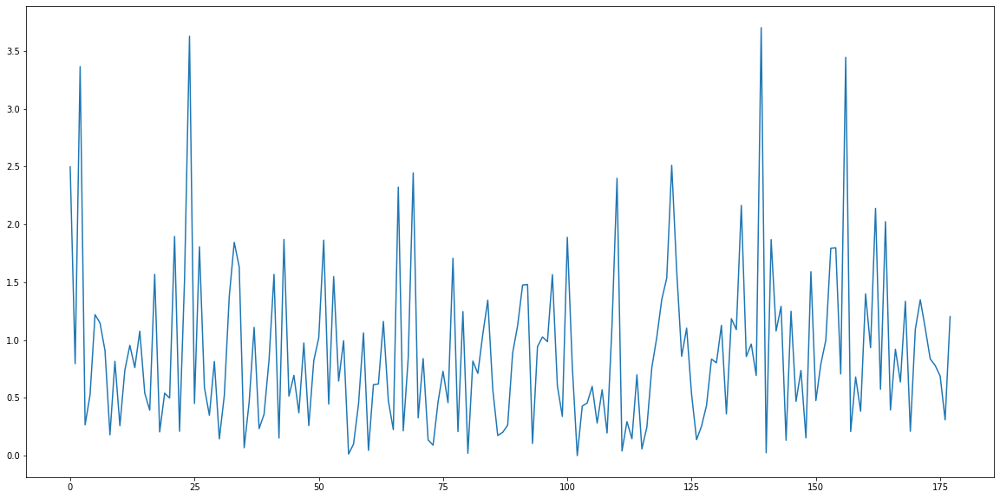

,difference,indexes
0,3.364692,"[2, 3]"
1,3.627613,"[24, 25]"
2,3.701467,"[139, 140]"
3,3.444433,"[156, 157]"


In [21]:
# calculating the diffrence between the frames
diff_vid4,indexes_vid4 = values_diff(avg_intensity_frames4)

# delete values less than 8

diff = []
indexes = []

for i in range(len(diff_vid4)):
    if diff_vid4[i] > 3:
        diff.append(diff_vid4[i])
        indexes.append(indexes_vid4[i])

pd.DataFrame({"difference": diff, "indexes": indexes})

133.78764862447736

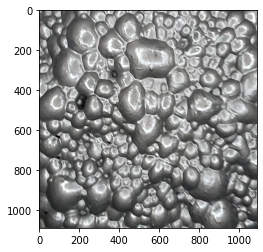

In [22]:
# calculating of the average of frames in the indexe 2 of the list frames4
i = 0
for image in frames4[2]:
        avg_image = image
        if i == 0:
            i += 1
            pass
        else:
            alpha = 1.0/(i + 1)
            beta = 1.0 - alpha
            avg_image = cv.addWeighted(avg_image, alpha, image, beta, 0.0)
            i += 1

# ploting avg_image
plt.imshow(avg_image, cmap='gray')

np.mean(avg_image)

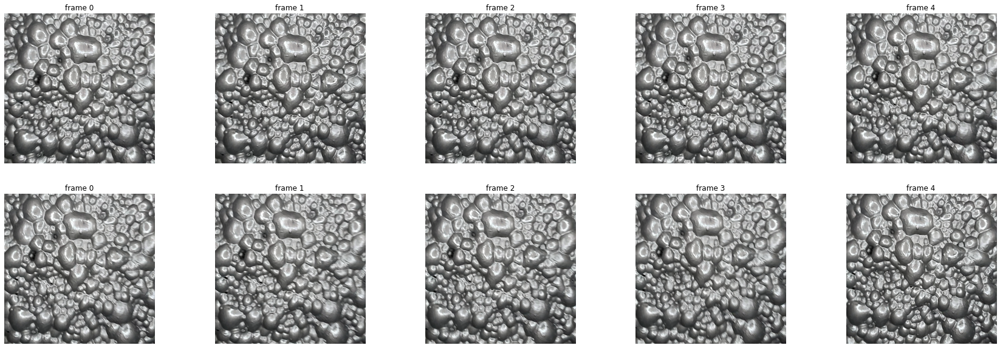

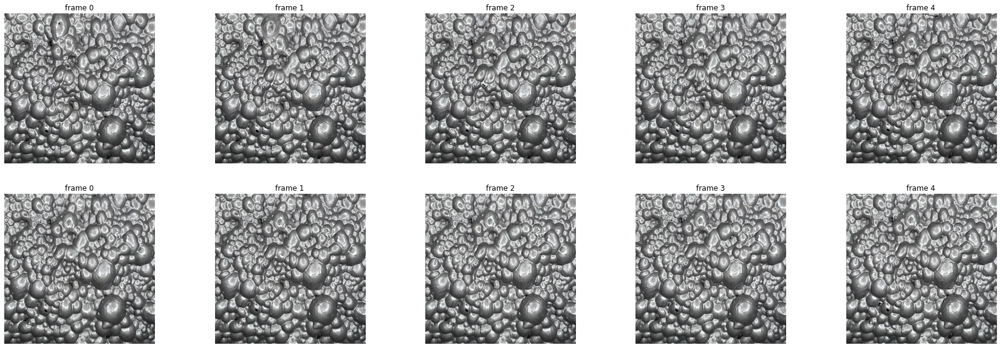

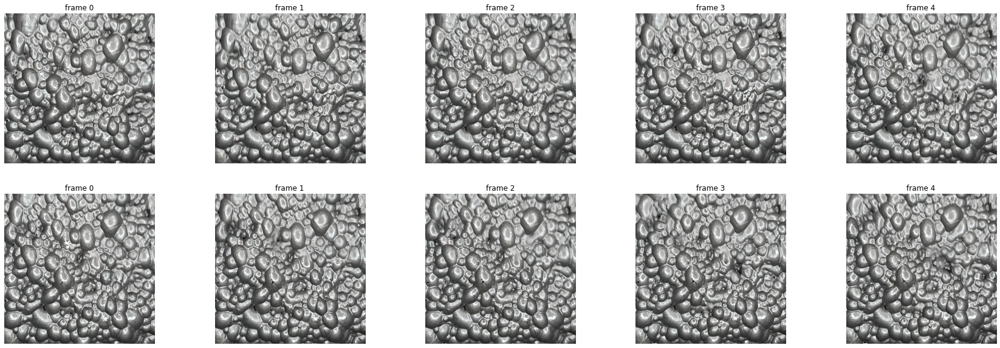

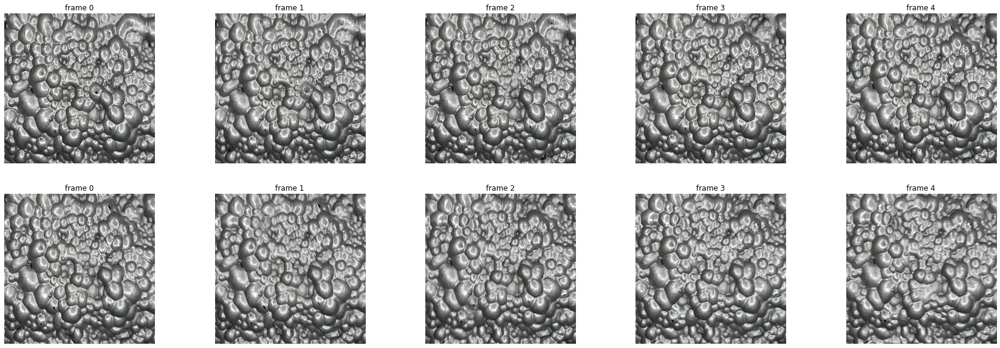

In [23]:
# ploting the frames
for i in indexes:
    plot_diff_frames(frames4, i[0], i[1])

index of the biggest difference: 139 , 140 and the difference is: 138.1045749756704 - 134.40310827341045 = 3.7014667022599497


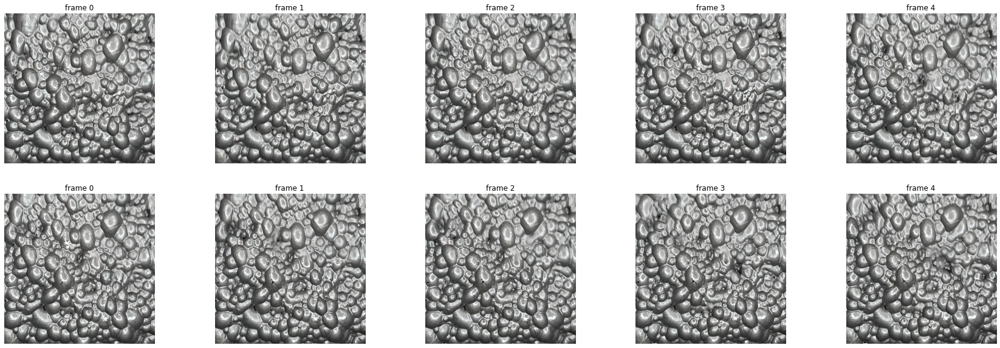

In [24]:

index_of_biggest_difference4 = get_index_of_biggest_difference(avg_intensity_frames4)

print(f"index of the biggest difference: {index_of_biggest_difference4} , {index_of_biggest_difference4 + 1} and the difference is: {avg_intensity_frames4[index_of_biggest_difference4]} - {avg_intensity_frames4[index_of_biggest_difference4+1]} = {abs(avg_intensity_frames4[index_of_biggest_difference4] - avg_intensity_frames4[index_of_biggest_difference4+1])}")

plot_diff_frames(frames4,index_of_biggest_difference4, index_of_biggest_difference4 + 1)

index of the biggest difference: 33 , 35 and the difference is: 128.256100136516 - 131.7336805931012 = 3.4775804565852013


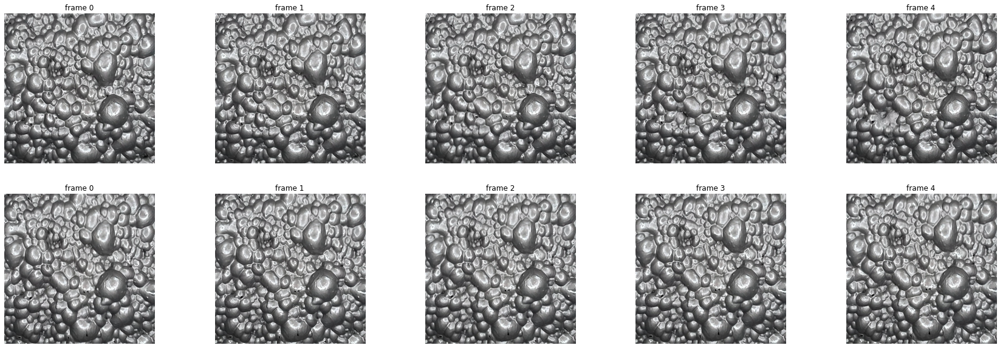

In [25]:
index_of_biggest_difference4 = 33

print(f"index of the biggest difference: {index_of_biggest_difference4} , {index_of_biggest_difference4 + 2} and the difference is: {avg_intensity_frames4[index_of_biggest_difference4]} - {avg_intensity_frames4[index_of_biggest_difference4+2]} = {abs(avg_intensity_frames4[index_of_biggest_difference4] - avg_intensity_frames4[index_of_biggest_difference4+2])}")

plot_diff_frames(frames4,index_of_biggest_difference4, index_of_biggest_difference4 + 2)

# Conclusion

Adding the smoothing and sharpening filters did not improve the results (at least in this case of the two videos), but it did add on the time of the process. so we can not say that it is a good idea to use these filters.